In [55]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam, SGD  
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

Importiamo  i   dati

In [35]:
my_data = np.genfromtxt('ML-CUP24-TR.csv', delimiter=',')
X = my_data[:, 1:13]
y = my_data[:, 13:16]
print(X.shape, y.shape)

(250, 12) (250, 3)


Suddividi   i   dati    in  TR,VL,TS    e   normalizza. Definisci   poi un  k-fold, k=5

In [47]:
X_train_val,X_test,y_train_val,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

scaler_X = StandardScaler().fit(X_train_val)
scaler_y = StandardScaler().fit(y_train_val)

X_train_val=scaler_X.transform(X_train_val)
y_train_val = scaler_y.transform(y_train_val)

y_test = scaler_y.transform(y_test)
X_test=scaler_X.transform(X_test)

k=5
kf= KFold(n_splits=k,shuffle=True,random_state=42)

Definisci una grid gridsearch : inizializza un dizionario con le varie configurazioni  e utilizza una k-fold  per ogni combinazione 

In [ ]:
param_grid={
    'neurons_layer1':[4,8,16],
    'neurons_layer2':[4,8,16],
    'learning_rate':[0.0001,0.001],
    'batch_size':[16,32, 64],
    'epochs':[500],
}

Crea  un  modello con paramteri   dinamici e funzione di  attivazione sigmoide  

In [ ]:
def nn_model1(neurons_layer1=16,neurons_layer2=16,learning_rate=0.001):
    model=Sequential([
        Dense(neurons_layer1,activation='relu',input_dim=X_train_val.shape[1], kernel_regularizer=l2(0.01)),
        Dense(neurons_layer2,activation='relu'),
        Dense(1,activation='linear')
    ])

    optimizer=Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer,loss='mean_squared_error',metrics=['mae'])
    return  model

In [ ]:
def plot_tr_vl(history, config_label):
    plt.figure(figsize=(12,6))
    plt.plot(history.history['loss'], label='Training loss')
    plt.plot(history.history['val_loss'], label='Validation loss')
    plt.title(f'Training e Validation loss - {config_label}')
    plt.xlabel('Epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.grid(True)
    plt.show()

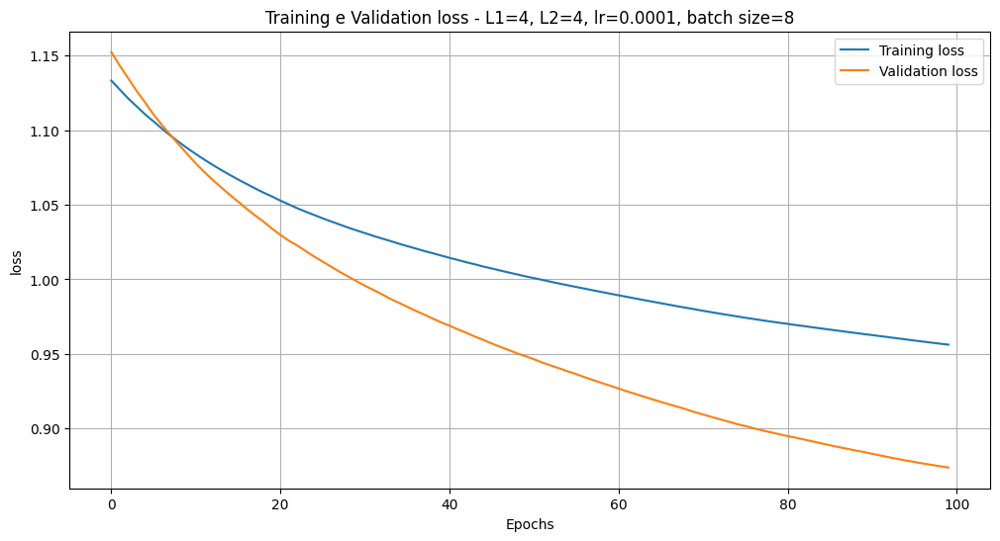

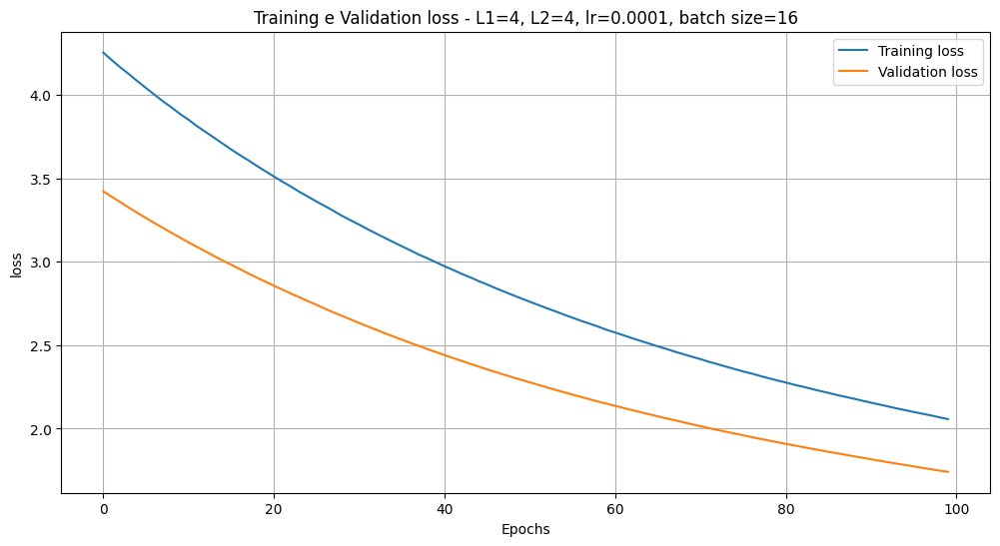

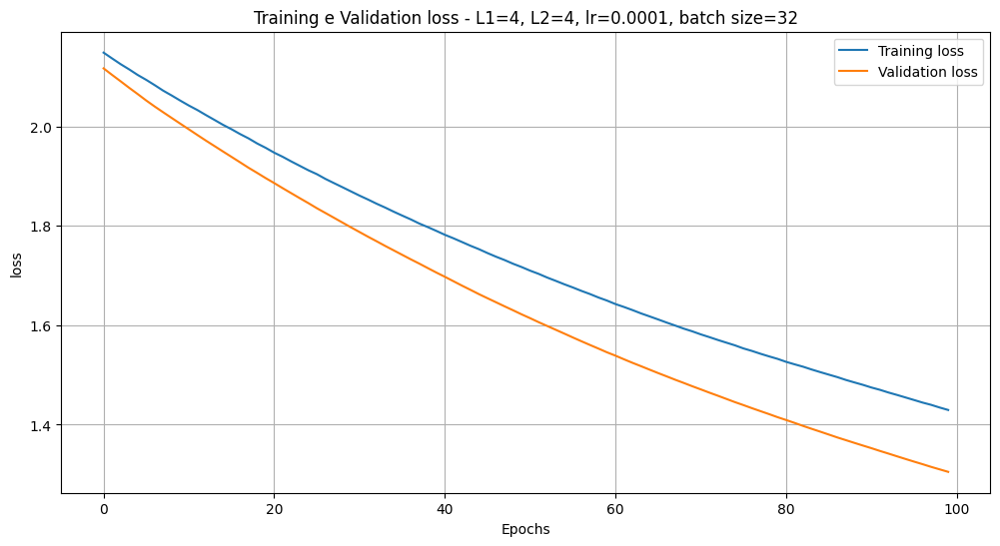

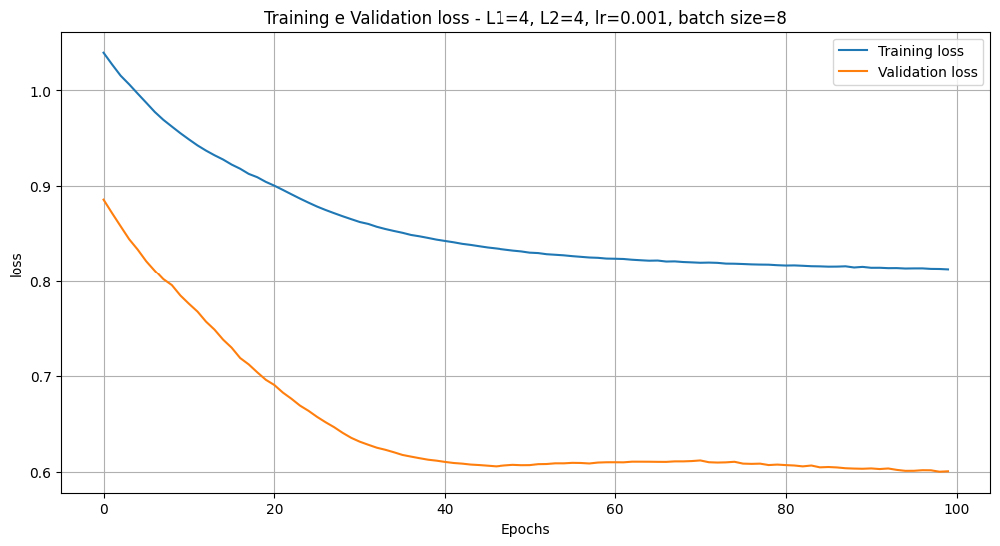

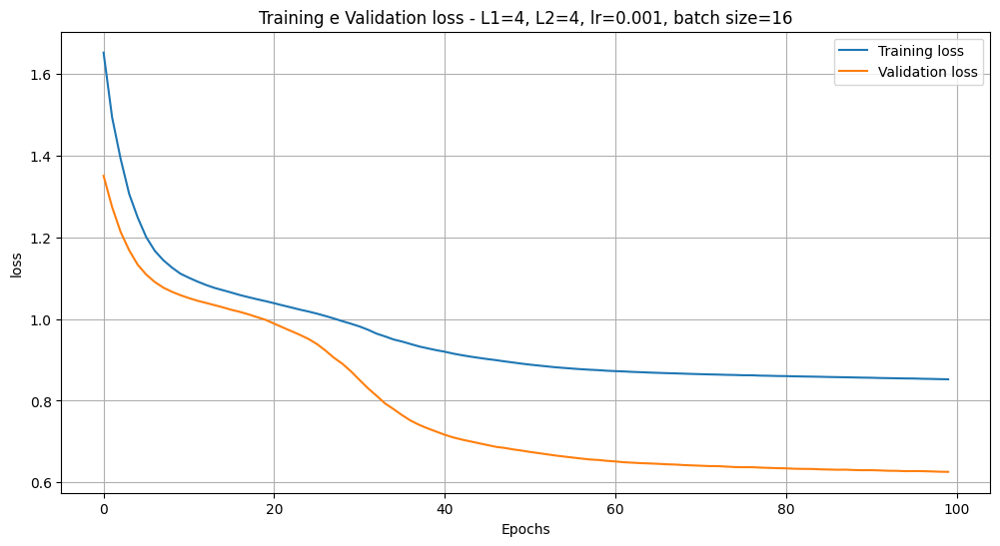

...

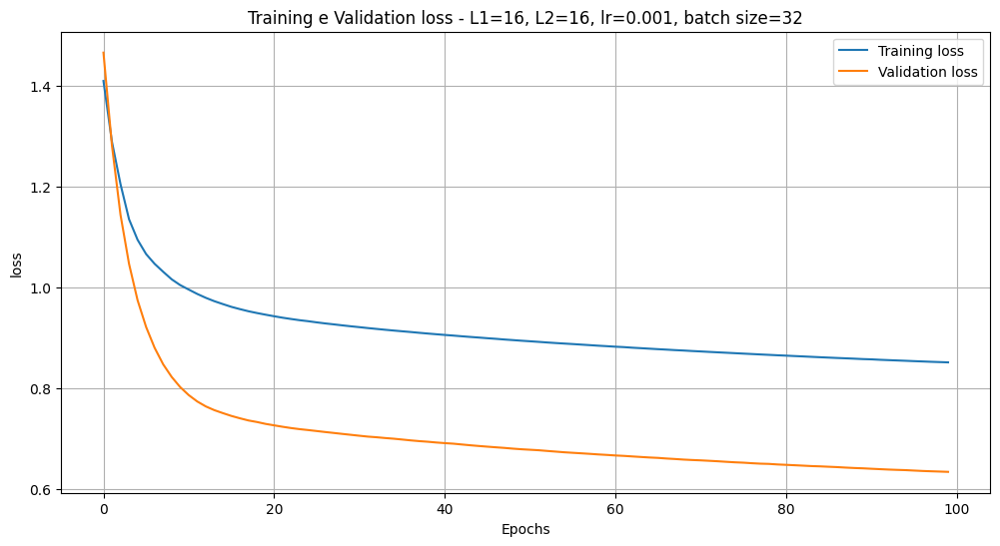

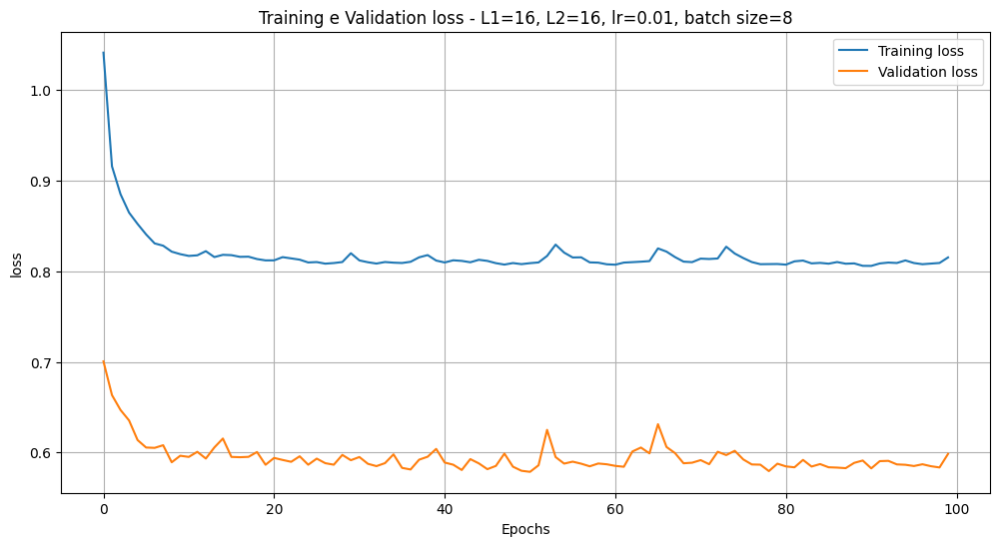

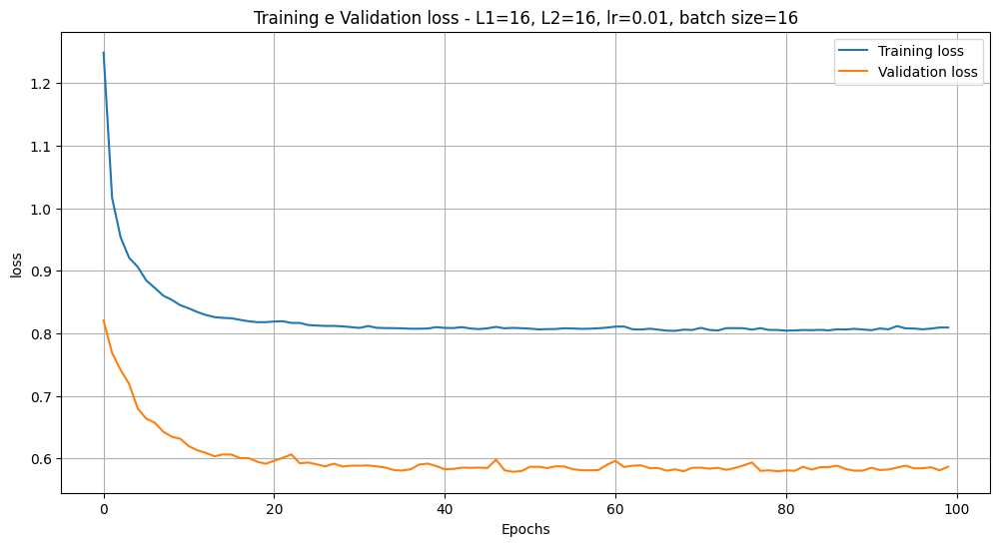

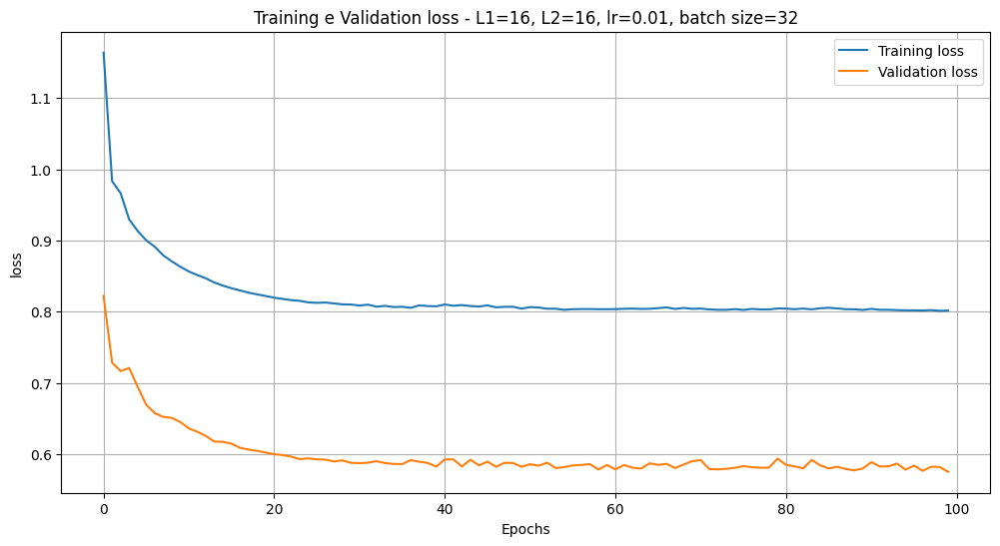

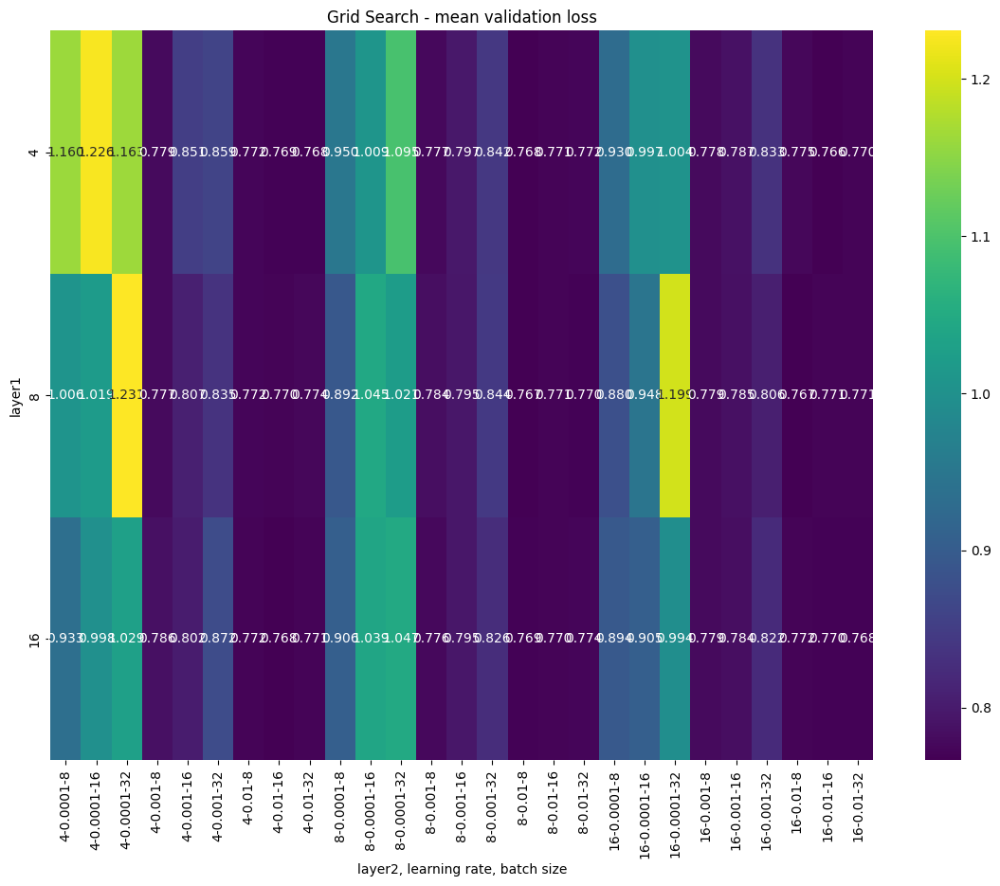

In [52]:
def grid_search(X_train_val, y_train_val, k, param_grid):
    results=[]
    kf= KFold(n_splits=k, shuffle=True, random_state= 42)

    for neurons_layer1 in param_grid['neurons_layer1']:
        for neurons_layer2 in param_grid['neurons_layer2']:
            for lr in param_grid['learning_rate']:
                for batch_size in param_grid['batch_size']:
                    val_losses = []

                    for train_idx, val_idx in kf.split(X_train_val):
                        X_tr, X_val = X_train_val[train_idx], X_train_val[val_idx]
                        y_tr, y_val = y_train_val[train_idx], y_train_val[val_idx]

                        model = nn_model1(neurons_layer1=neurons_layer1,
                                         neurons_layer2= neurons_layer2,
                                         learning_rate=lr)

                        history = model.fit(X_tr, y_tr,
                                            epochs=param_grid['epochs'][0],
                                            batch_size=batch_size,
                                            verbose=0,
                                            validation_data=(X_val, y_val))

                        if len(val_losses)==0:
                            plot_tr_vl(history,
                                       f'L1={neurons_layer1}, L2={neurons_layer2}, lr={lr}, batch size={batch_size}')

                        val_losses.append(history.history['val_loss'][-1])

                    mean_val_loss=np.mean(val_losses)
                    results.append({
                        'neurons_layer1': neurons_layer1,
                        'neurons_layer2': neurons_layer2,
                        'learning_rate':lr,
                        'batch_size':batch_size,
                        'mean_val_loss':mean_val_loss
                    })

    results_df = pd.DataFrame(results)

    pivot_table=results_df.pivot_table(values='mean_val_loss',
                                       index='neurons_layer1',
                                       columns=['neurons_layer2', 'learning_rate', 'batch_size'])
    plt.figure(figsize=(14,10))
    sns.heatmap(pivot_table, annot=True, fmt=".3f",cmap="viridis")
    plt.title("Grid Search - mean validation loss")
    plt.xlabel("layer2, learning rate, batch size")
    plt.ylabel("layer1")
    plt.show()

    return results_df

results_df= grid_search(X_train_val, y_train_val, k=5, param_grid=param_grid)
results_df.to_csv("grid_search_results.csv", index=False)


C:\Users\admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


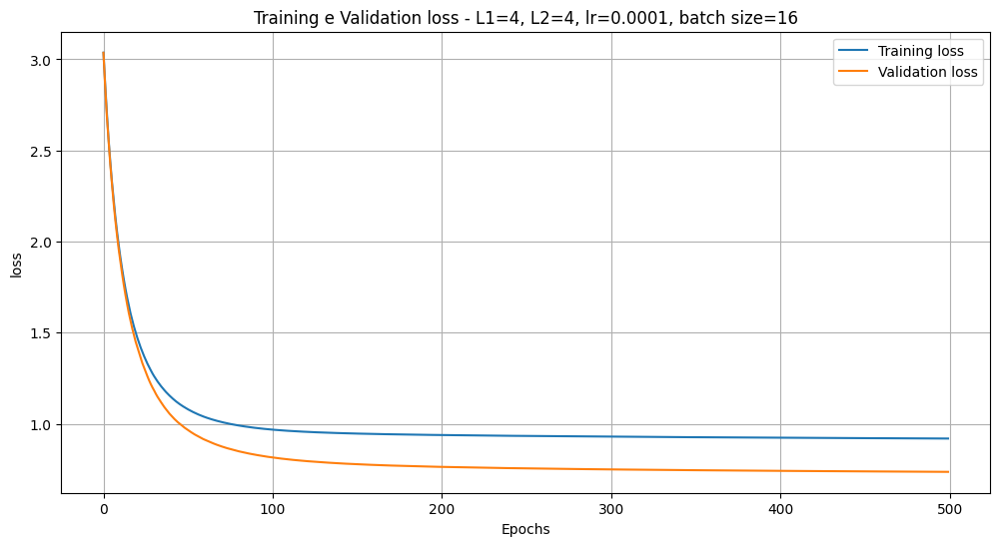

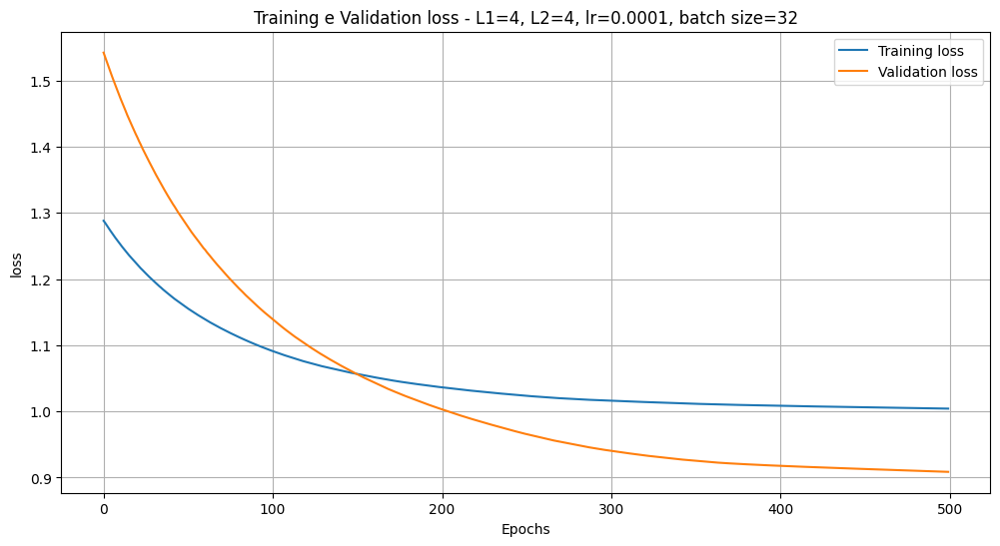

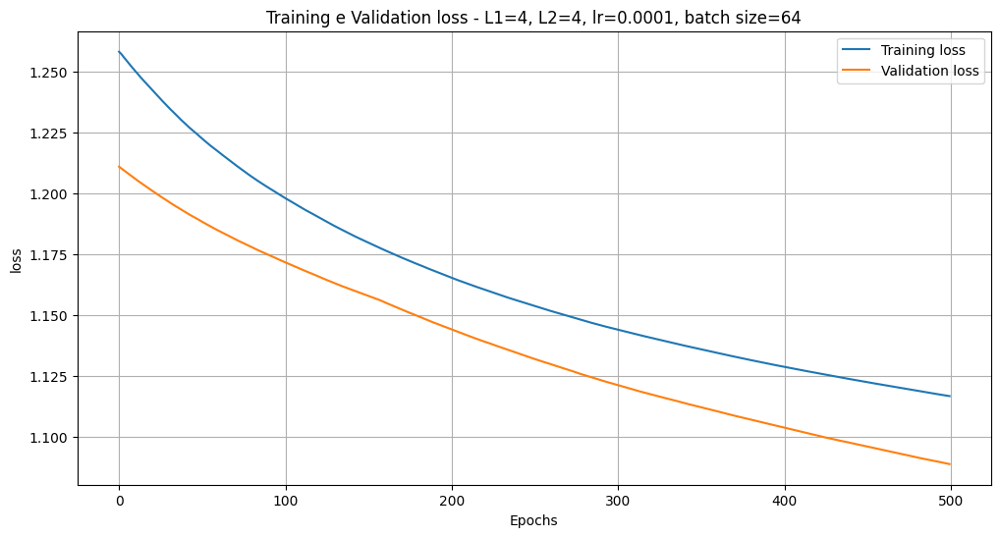

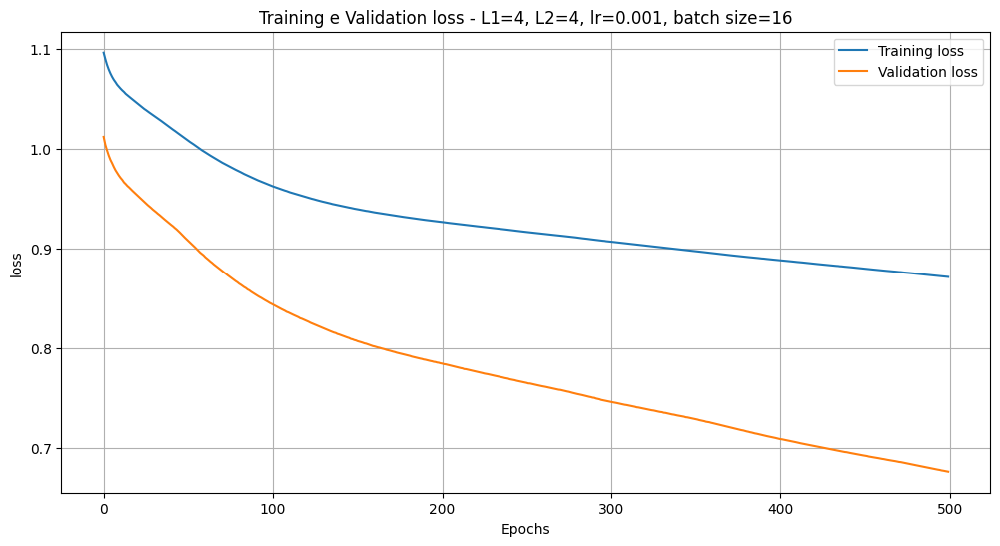

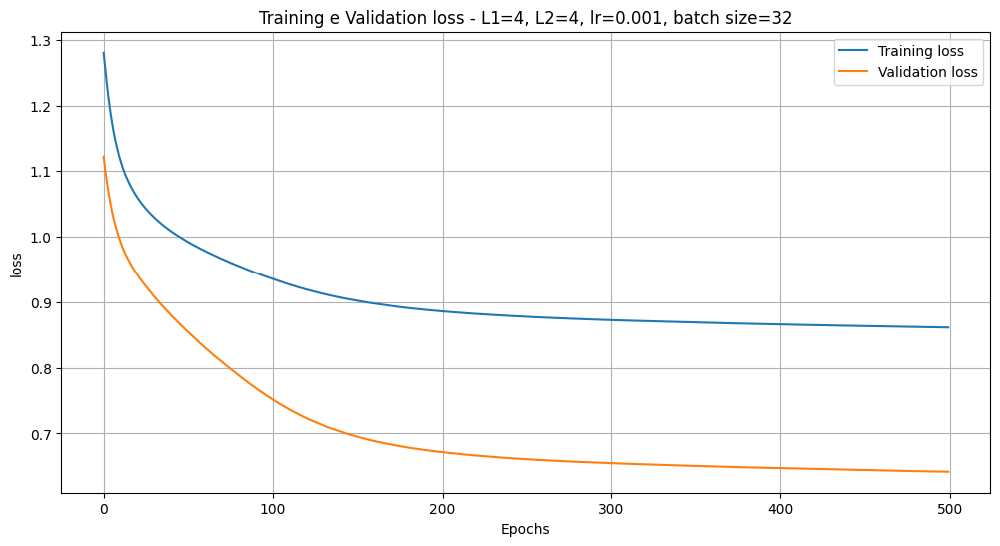

...

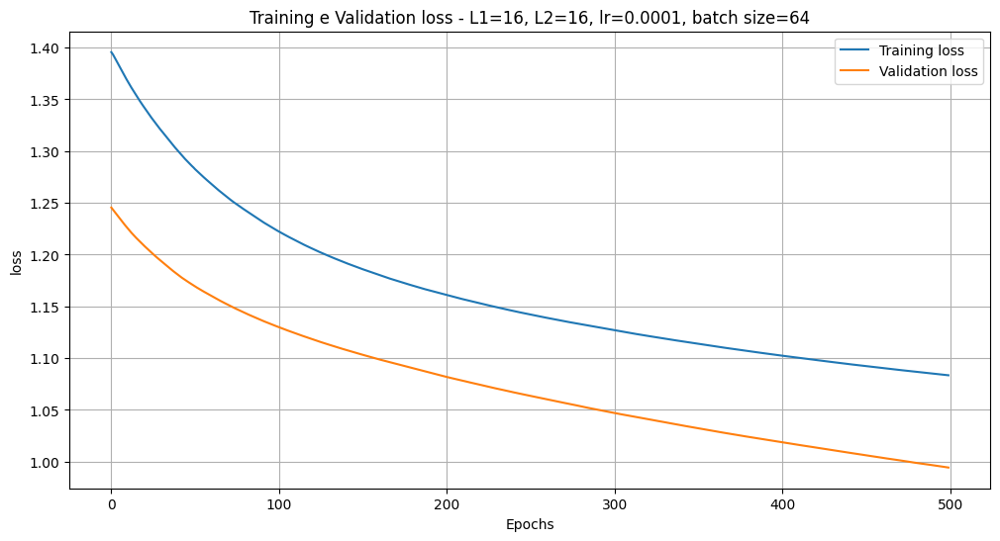

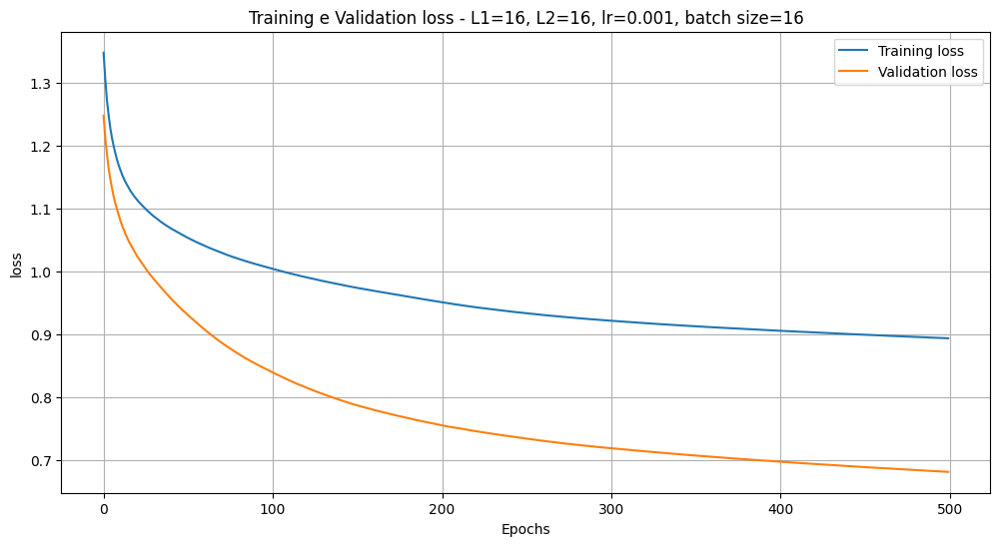

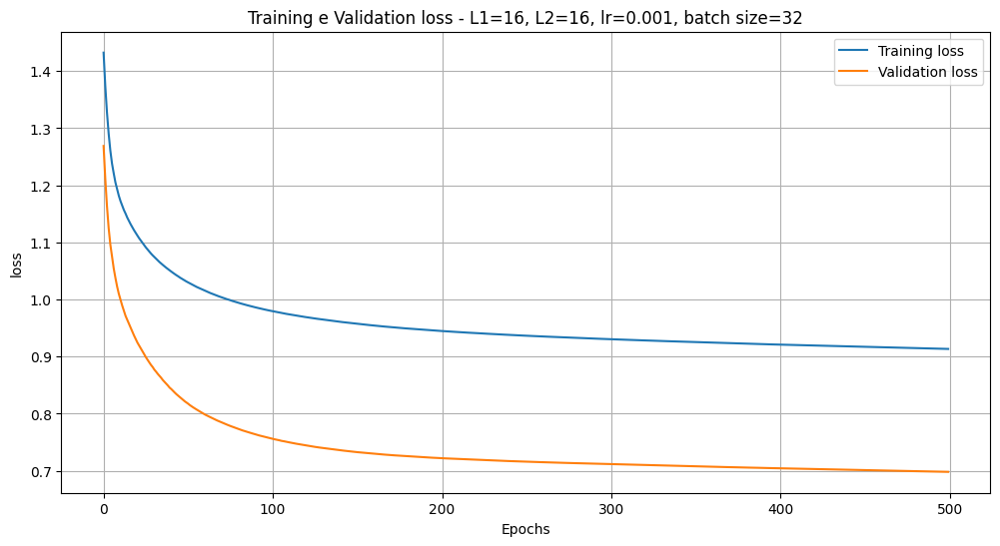

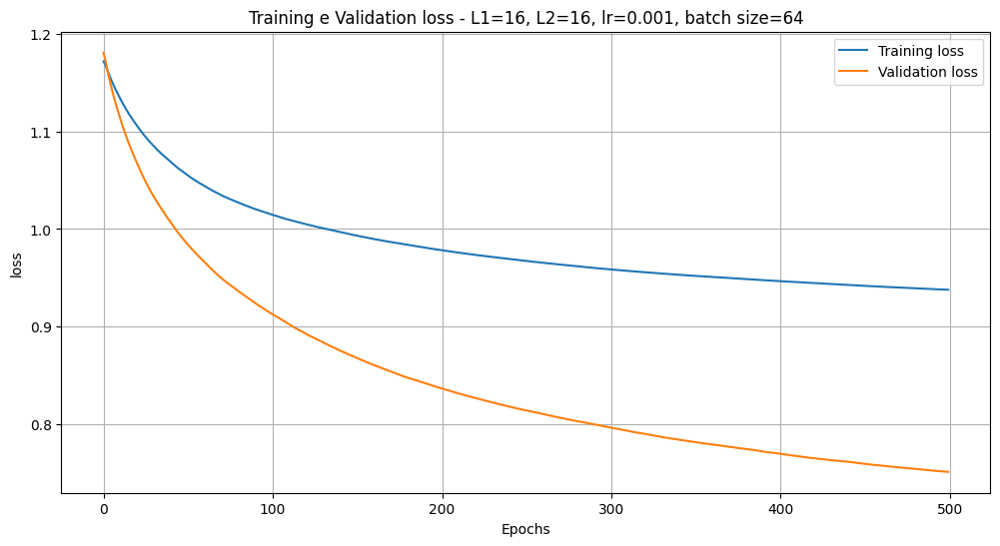

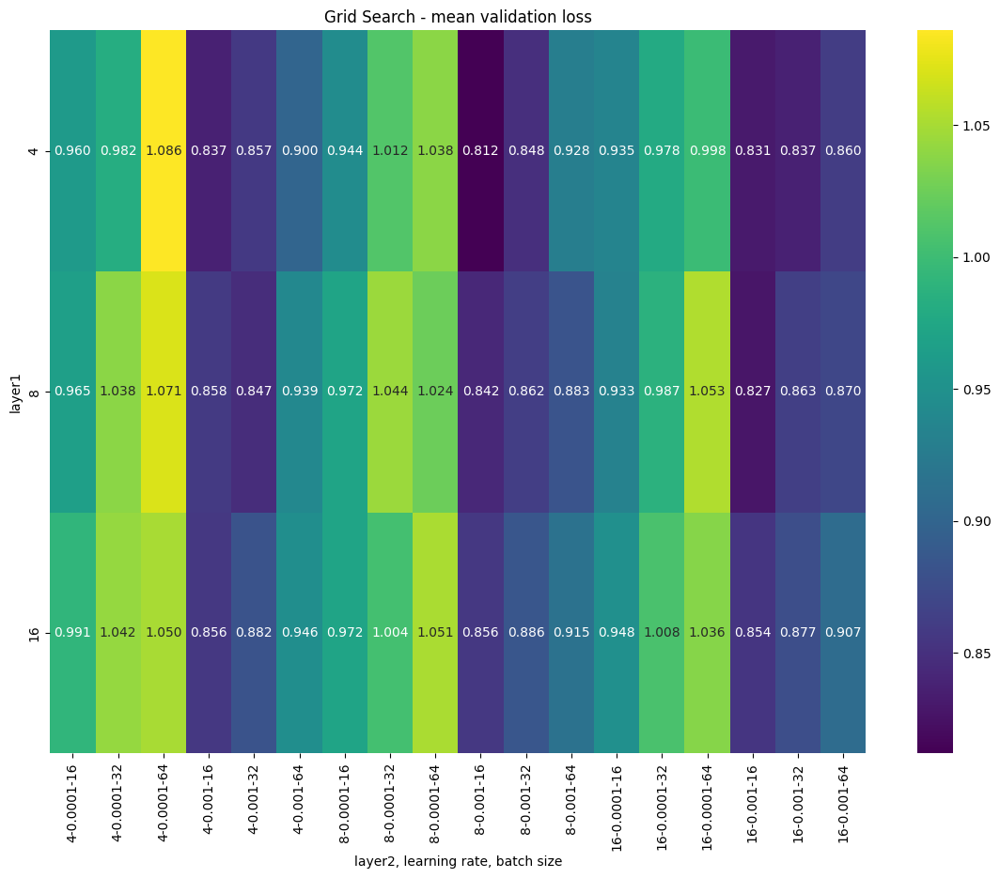

In [56]:
param_grid={
    'neurons_layer1':[4,8,16],
    'neurons_layer2':[4,8,16],
    'learning_rate':[0.0001,0.001],
    'batch_size':[16,32, 64],
    'epochs':[500],
}

def nn_model2(neurons_layer1=16,neurons_layer2=16,learning_rate=0.001):
    model=Sequential([
        Dense(neurons_layer1,activation='relu',input_dim=X_train_val.shape[1], kernel_regularizer=l2(0.01)),
        Dense(neurons_layer2,activation='relu'),
        Dense(1,activation='linear')
    ])

    optimizer=SGD(learning_rate=learning_rate, momentum=0.6)
    model.compile(optimizer=optimizer,loss='mean_squared_error',metrics=['mae'])
    return  model

def grid_search(X_train_val, y_train_val, k, param_grid):
    results=[]
    kf= KFold(n_splits=k, shuffle=True, random_state= 42)

    for neurons_layer1 in param_grid['neurons_layer1']:
        for neurons_layer2 in param_grid['neurons_layer2']:
            for lr in param_grid['learning_rate']:
                for batch_size in param_grid['batch_size']:
                    val_losses = []

                    for train_idx, val_idx in kf.split(X_train_val):
                        X_tr, X_val = X_train_val[train_idx], X_train_val[val_idx]
                        y_tr, y_val = y_train_val[train_idx], y_train_val[val_idx]

                        model = nn_model2(neurons_layer1=neurons_layer1,
                                         neurons_layer2= neurons_layer2,
                                         learning_rate=lr)

                        history = model.fit(X_tr, y_tr,
                                            epochs=param_grid['epochs'][0],
                                            batch_size=batch_size,
                                            verbose=0,
                                            validation_data=(X_val, y_val))

                        if len(val_losses)==0:
                            plot_tr_vl(history,
                                       f'L1={neurons_layer1}, L2={neurons_layer2}, lr={lr}, batch size={batch_size}')

                        val_losses.append(history.history['val_loss'][-1])

                    mean_val_loss=np.mean(val_losses)
                    results.append({
                        'neurons_layer1': neurons_layer1,
                        'neurons_layer2': neurons_layer2,
                        'learning_rate':lr,
                        'batch_size':batch_size,
                        'mean_val_loss':mean_val_loss
                    })

    results_df = pd.DataFrame(results)

    pivot_table=results_df.pivot_table(values='mean_val_loss',
                                       index='neurons_layer1',
                                       columns=['neurons_layer2', 'learning_rate', 'batch_size'])
    plt.figure(figsize=(14,10))
    sns.heatmap(pivot_table, annot=True, fmt=".3f",cmap="viridis")
    plt.title("Grid Search - mean validation loss")
    plt.xlabel("layer2, learning rate, batch size")
    plt.ylabel("layer1")
    plt.show()

    return results_df

results_df= grid_search(X_train_val, y_train_val, k=5, param_grid=param_grid)
results_df.to_csv("grid_search_results2.csv", index=False)



C:\Users\admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


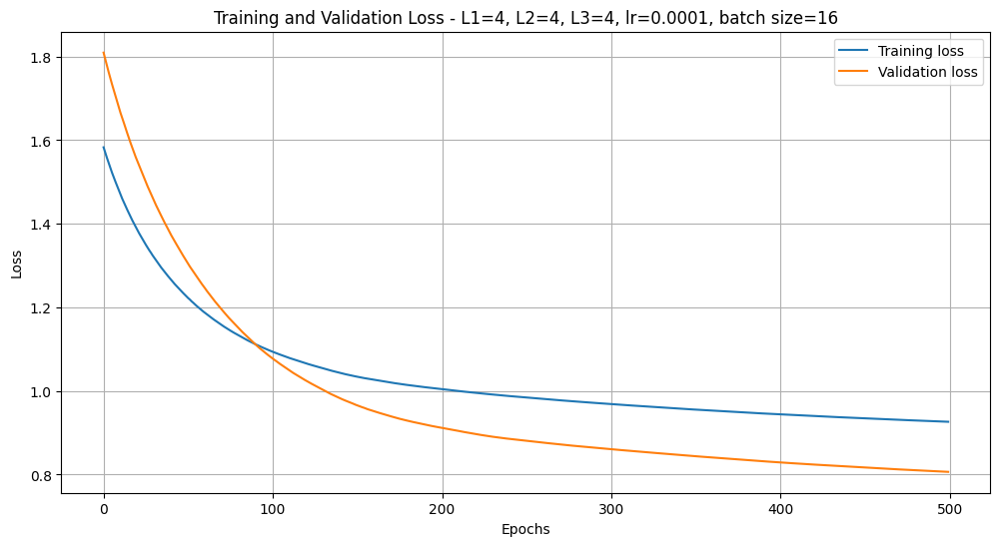

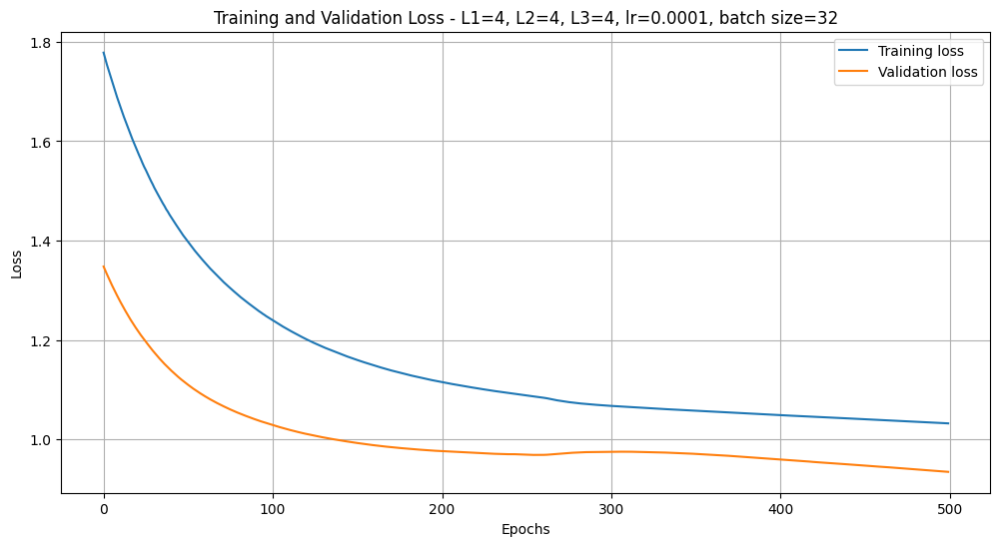

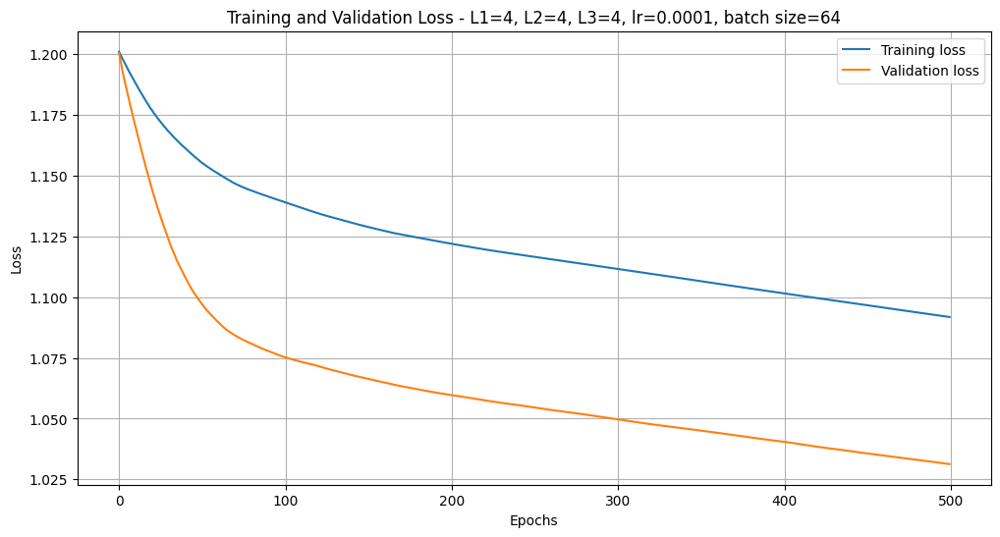

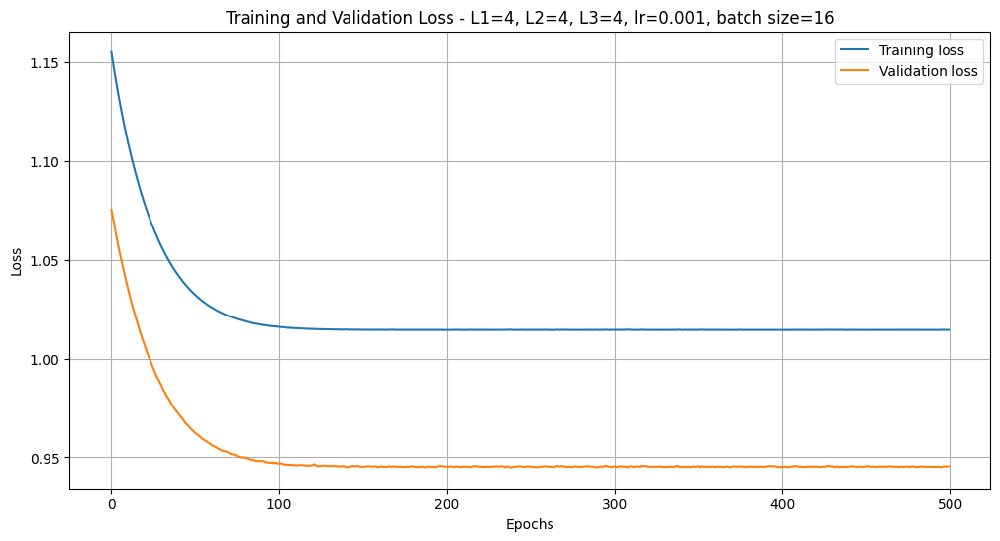

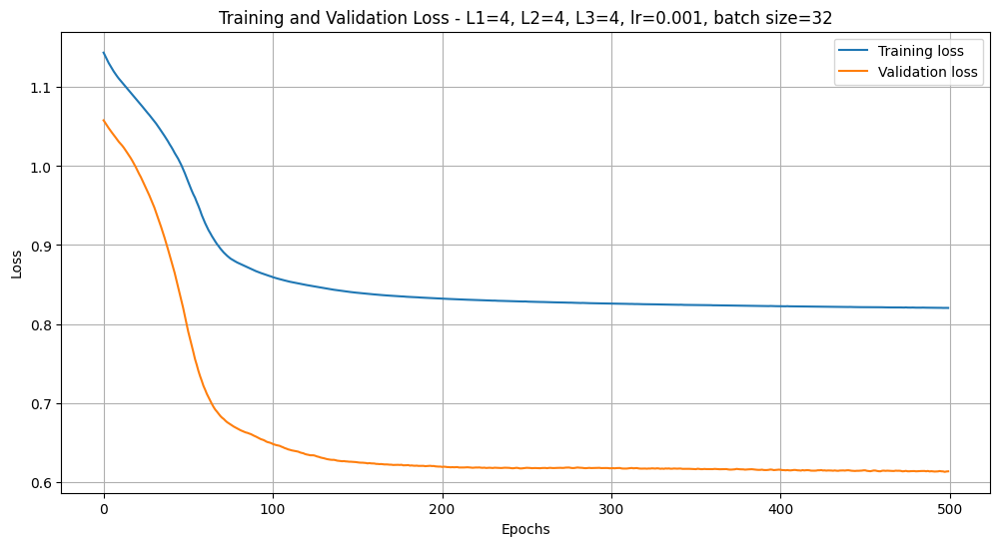

...

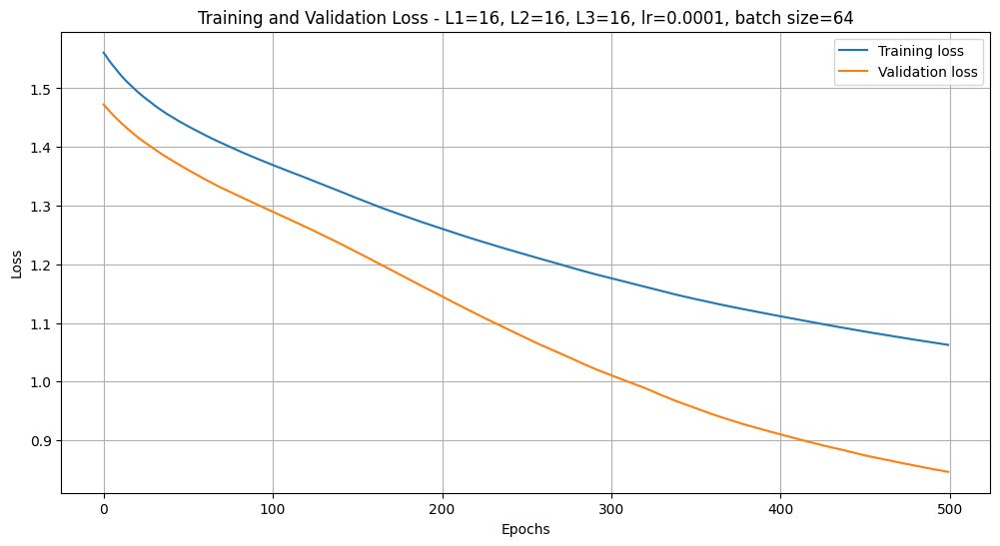

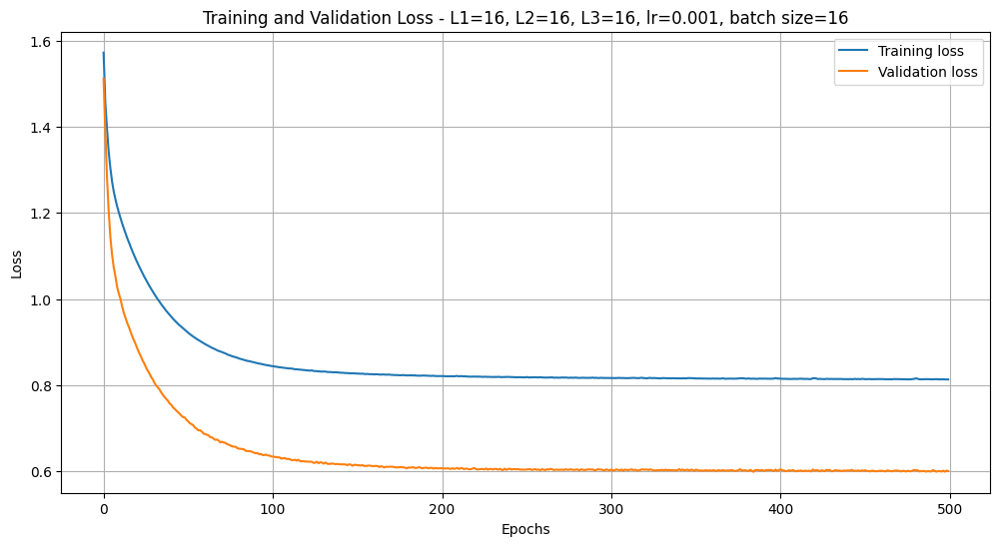

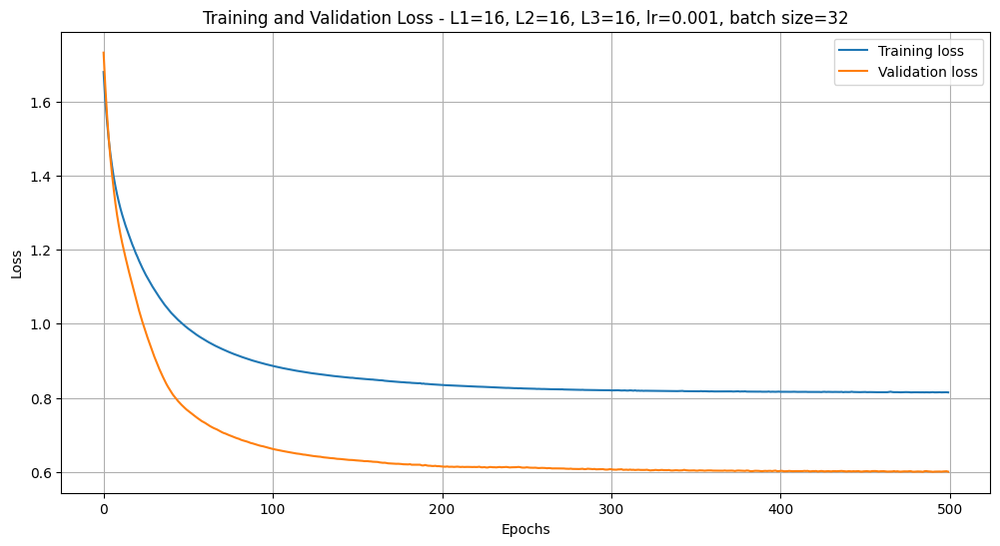

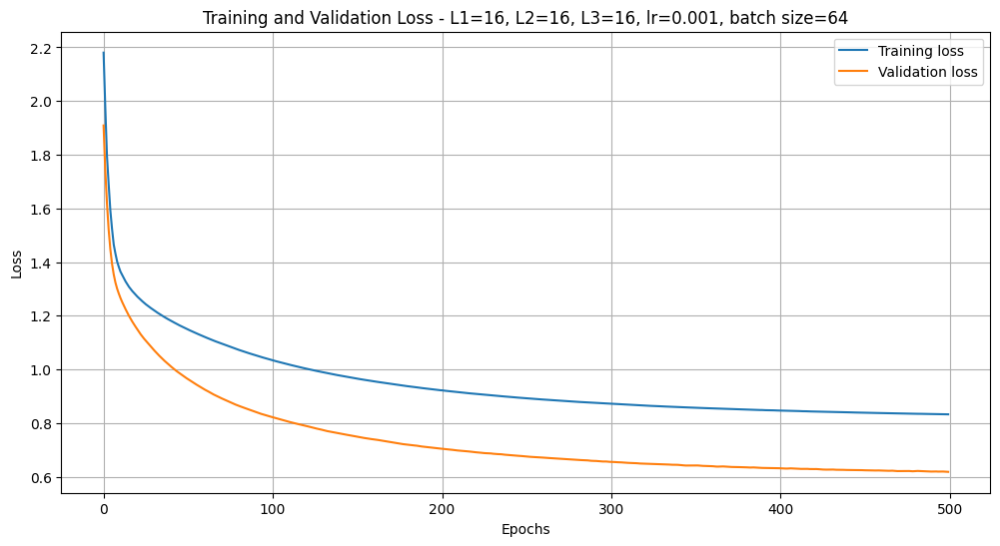

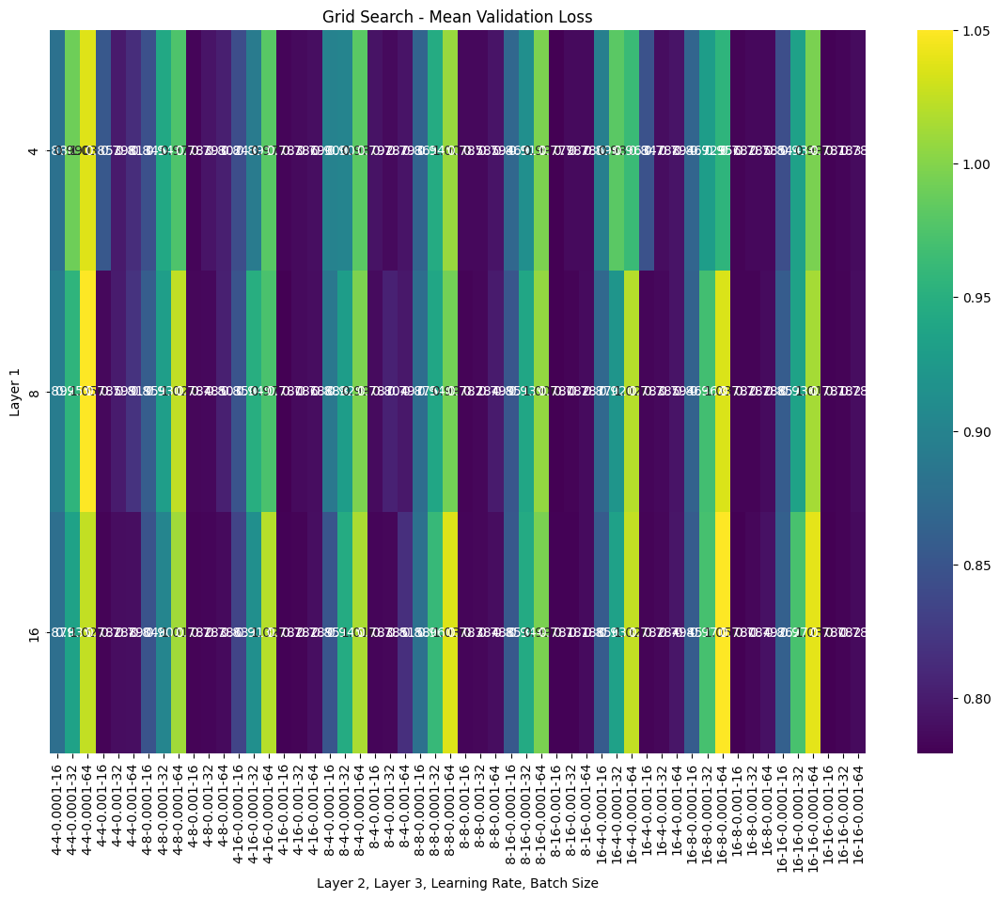

In [57]:
param_grid = {
    'neurons_layer1': [4, 8, 16],
    'neurons_layer2': [4, 8, 16],
    'neurons_layer3': [4, 8, 16],  
    'learning_rate': [0.0001, 0.001],
    'batch_size': [16, 32, 64],
    'epochs': [500],
}


def nn_model3(neurons_layer1=16, neurons_layer2=16, neurons_layer3=16, learning_rate=0.001):
    model = Sequential([
        Dense(neurons_layer1, activation='relu', input_dim=X_train_val.shape[1], kernel_regularizer=l2(0.01)),
        Dense(neurons_layer2, activation='relu', kernel_regularizer=l2(0.01)),
        Dense(neurons_layer3, activation='relu', kernel_regularizer=l2(0.01)),  # Third layer
        Dense(3, activation='linear')
    ])
    
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])
    return model

def plot_tr_vl(history, config_label):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training loss')
    plt.plot(history.history['val_loss'], label='Validation loss')
    plt.title(f'Training and Validation Loss - {config_label}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

def grid_search(X_train_val, y_train_val, k, param_grid):
    results = []
    kf = KFold(n_splits=k, shuffle=True, random_state=42)

    for neurons_layer1 in param_grid['neurons_layer1']:
        for neurons_layer2 in param_grid['neurons_layer2']:
            for neurons_layer3 in param_grid['neurons_layer3']: 
                for lr in param_grid['learning_rate']:
                    for batch_size in param_grid['batch_size']:
                        val_losses = []

                        for train_idx, val_idx in kf.split(X_train_val):
                            X_tr, X_val = X_train_val[train_idx], X_train_val[val_idx]
                            y_tr, y_val = y_train_val[train_idx], y_train_val[val_idx]

                            model = nn_model3(neurons_layer1=neurons_layer1,
                                             neurons_layer2=neurons_layer2,
                                             neurons_layer3=neurons_layer3,
                                             learning_rate=lr)

                            history = model.fit(X_tr, y_tr,
                                                epochs=param_grid['epochs'][0],
                                                batch_size=batch_size,
                                                verbose=0,
                                                validation_data=(X_val, y_val))

                            # Plot the first configuration for reference
                            if len(val_losses) == 0:
                                plot_tr_vl(history,
                                           f'L1={neurons_layer1}, L2={neurons_layer2}, L3={neurons_layer3}, '
                                           f'lr={lr}, batch size={batch_size}')

                            val_losses.append(history.history['val_loss'][-1])

                        mean_val_loss = np.mean(val_losses)
                        results.append({
                            'neurons_layer1': neurons_layer1,
                            'neurons_layer2': neurons_layer2,
                            'neurons_layer3': neurons_layer3,
                            'learning_rate': lr,
                            'batch_size': batch_size,
                            'mean_val_loss': mean_val_loss
                        })

    results_df = pd.DataFrame(results)

    pivot_table = results_df.pivot_table(
        values='mean_val_loss',
        index='neurons_layer1',
        columns=['neurons_layer2', 'neurons_layer3', 'learning_rate', 'batch_size']
    )
    
    plt.figure(figsize=(14, 10))
    sns.heatmap(pivot_table, annot=True, fmt=".3f", cmap="viridis")
    plt.title("Grid Search - Mean Validation Loss")
    plt.xlabel("Layer 2, Layer 3, Learning Rate, Batch Size")
    plt.ylabel("Layer 1")
    plt.show()

    return results_df

results_df = grid_search(X_train_val, y_train_val, k=5, param_grid=param_grid)
results_df.to_csv("grid_search_results_with_3layers.csv", index=False)
